# Load packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import scipy as sp
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_score
import os

# Make MERFISH ventricle subset object

In [2]:
adata_merfish = sc.read_h5ad('../data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15.h5ad')

In [3]:
# read in region annotations
coords_anno_4C4 = pd.read_csv('../data/MERFISH/raw/R77_4C4_coordinates_annotated_atria_2.csv', index_col = 0)
coords_anno_4C4.index = coords_anno_4C4.index.astype('str') + '-R77_4C4'

coords_anno_4C12 = pd.read_csv('../data/MERFISH/raw/R78_4C12_coordinates_annotated_atria_2.csv', index_col = 0)
coords_anno_4C12.index = coords_anno_4C12.index.astype('str') + '-R78_4C12'

coords_anno_4C15 = pd.read_csv('../data/MERFISH/raw/R78_4C15_coordinates_annotated_atria_2.csv', index_col = 0)
coords_anno_4C15.index = coords_anno_4C15.index.astype('str') + '-R78_4C15'

coords_anno = pd.concat([coords_anno_4C4, coords_anno_4C12, coords_anno_4C15])

adata_merfish.obs['Region'] = coords_anno.loc[adata_merfish.obs.index,'Region']
adata_merfish.obs['Region'] = adata_merfish.obs['Region'].str.replace('black','Ventricle')

... storing 'Region' as categorical


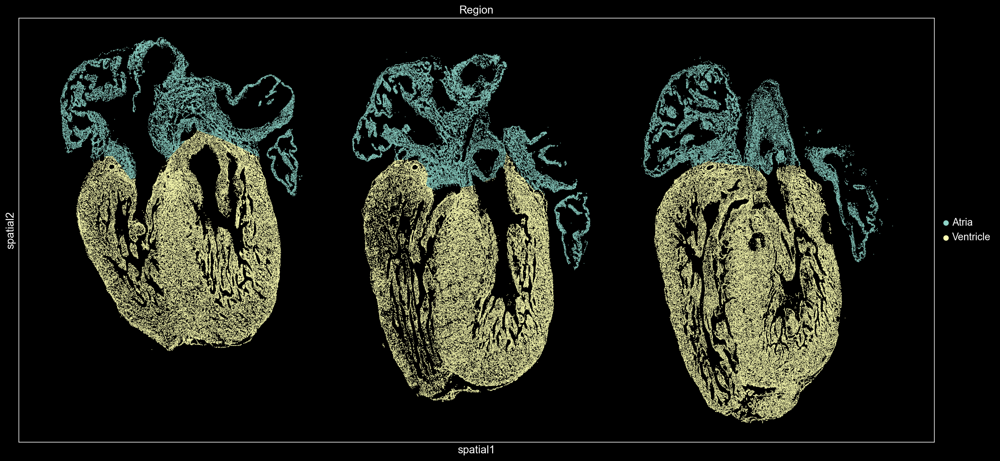

In [4]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish, basis="spatial", color="Region", size=3)
plt.style.use('default')

In [5]:
# Subset to ventriclar cells and reprocess
adata_merfish_subset = adata_merfish[adata_merfish.obs['Region']=='Ventricle']
sc.pp.pca(adata_merfish_subset)
sc.pp.neighbors(adata_merfish_subset)
sc.tl.umap(adata_merfish_subset)

In [6]:
sc.tl.leiden(adata_merfish_subset, key_added="leiden", resolution=5)

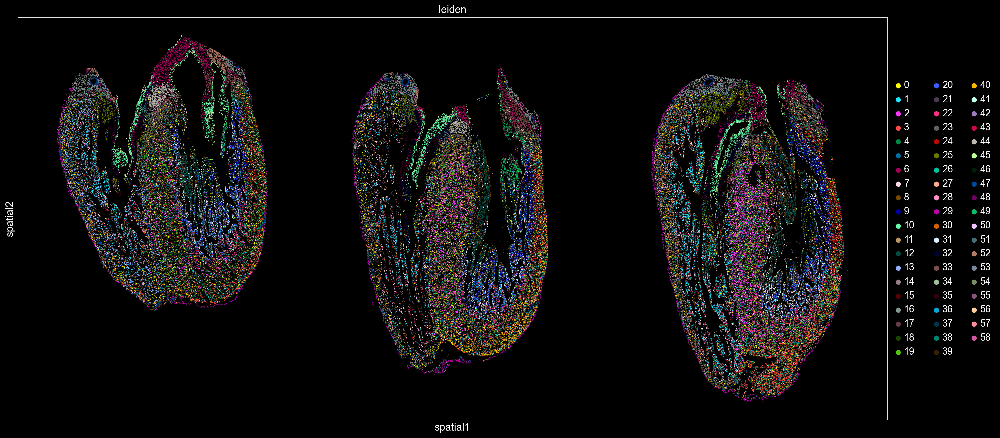

In [7]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish_subset, 
                basis="spatial", color="leiden", size=3)
plt.style.use('default')

In [8]:
subset_cluster_annotations = {'0':'VE', '1':'Trabecular vCM-RV', '2':'Compact vCM-LV', '3':'Compact vCM-LV', '4':'Compact vFibro',
    '5':'Pericyte', '6':'VIC', '7':'vEndocardial', '8':'Trabecular vFibro', '9':'Trabecular vCM-LV', '10':'VIC',
    '11':'Compact vCM-LV', '12':'Purkinje Fiber', '13':'Hybrid vCM-RV', '14':'Compact vCM-RV',
    '15':'Proliferating Compact vCM-LV', '16':'EPDC', '17':'Trabecular vFibro', '18':'Compact vCM-LV', '19':'Proliferating Compact vCM-LV',
    '20':'Trabecular vCM-LV', '21':'Proliferating Compact vCM-LV', '22':'Hybrid vCM-LV', '23':'avCM-LV', '24':'Compact vCM-LV',
    '25':'avCM-RV', '26':'Compact vCM-LV', '27':'Remove', '28':'Proliferating vCM-RV', '29':'Epicardial',
    '30':'Compact vCM-RV','31':'Proliferating Trabecular vCM-LV', '32':'avCM-RV', '33':'avCM-LV', '34':'Proliferating Compact vCM-LV',
    '35':'VEC', '36':'Proliferating Trabecular vCM-LV', '37':'Proliferating vCM-RV', '38':'Proliferating vFibro', '39':'Remove',
    '40':'Compact vCM-LV','41':'vEndocardial','42':'Remove','43':'Remove','44':'Bundle of His',
    '45':'VEC','46':'Trabecular vCM-LV','47':'VSMC','48':'Remove','49':'Trabecular vCM-LV',
    '50':'Remove','51':'Remove','52':'Remove','53':'WBC','54':'LEC',
    '55':'Remove','56':'avCM-LV','57':'Neuronal-like','58':'Remove'}
adata_merfish_subset.obs['celltype_vent'] = adata_merfish_subset.obs['leiden'].replace(subset_cluster_annotations)

In [9]:
adata_merfish_subset_filtered = adata_merfish_subset[adata_merfish_subset.obs['celltype_vent']!='Remove']

In [10]:
# Specify cell type colors
adata_merfish_subset_filtered.uns['celltype_vent_colors'] = ['#cb4936','#1616c8','#0D63A5','#A12568','#F499C1',
                                                             '#F7C394','#ff0000','#5ac1b3','#B2A157','#ade87c',
                                                             '#000000','#03C4A1','#bb4316','#7382BC','#645D84',
                                                             '#3B185F','#0d6c0d','#FEC260','#FD7014','#a67063',
                                                             '#1B9B8A','#D0EBE7','#713045','#F6E0EA','#AD6D28',
                                                             '#EAB67D','#EE4590']

Trying to set attribute `.uns` of view, copying.


... storing 'celltype_vent' as categorical


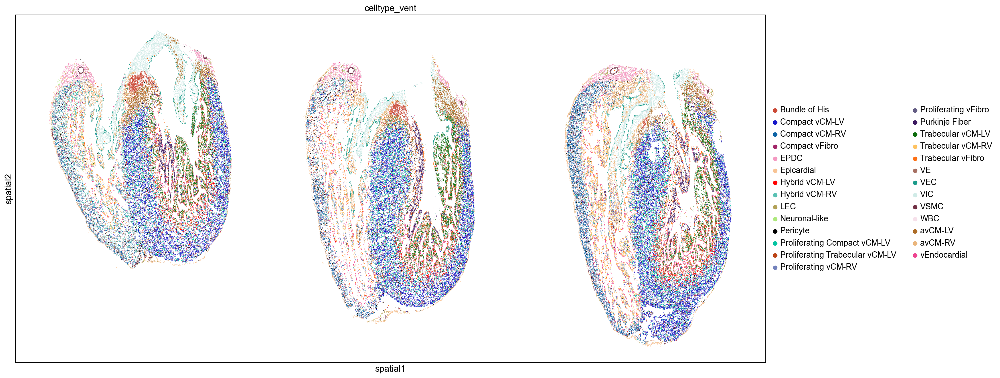

In [11]:
sc.set_figure_params(figsize=[21,10])
sc.pl.embedding(adata_merfish_subset_filtered, 
                basis="spatial", color="celltype_vent", size=3)
plt.style.use('default')

In [12]:
# adata_merfish_subset_filtered.write('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15_ventricle.h5ad')

# Load MERFISH object

In [13]:
adata_merfish_subset = sc.read_h5ad('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15_ventricle.h5ad')

# Community identification

## Calculate 'zone' cell type counts

In [12]:
celltype_key = 'celltype_vent'
for radius in [25,50,75,100,125,150,175,200,225,250,275,300]:
    print(radius)
    
    # sample = 'R77_4C4'
    for sample in ['R77_4C4','R78_4C12','R78_4C15']:
        print(sample)

        # subset to a section, find
        adata_merfish_section = adata_merfish_subset[adata_merfish_subset.obs['sample_id']==sample]
        # find the neighboring cells in the 'zone' around each cell
        point_tree = sp.spatial.cKDTree(adata_merfish_section.obsm['spatial'])
        neigh_inds_list = point_tree.query_ball_point(adata_merfish_section.obsm['spatial'], radius)
        neigh_celltype_df = pd.DataFrame(adata_merfish_section.obs[celltype_key][neigh_inds_list[0]].value_counts())
            
        # quantify the proportion of cell type in each zone
        neigh_celltype_list = []
        for i in tqdm(range(len(neigh_inds_list))):
            neigh_inds = neigh_inds_list[i]
            celltype_counts = pd.DataFrame(adata_merfish_section.obs[celltype_key][neigh_inds].value_counts())
            neigh_celltype_list.append(celltype_counts)
        neigh_celltype_df = pd.concat(neigh_celltype_list, axis=1)
            
        neigh_celltype_df.columns = adata_merfish_section.obs.index
        neigh_celltype_df = neigh_celltype_df.T
        
        neigh_celltype_df = neigh_celltype_df.fillna(0.0).astype('int')
    
        # write 'zone' cell type counts to file
        neigh_celltype_df.to_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/' + sample + '/merfish_neigh_' + celltype_key +'_counts_radius_' + str(radius) + '.csv')

## Cluster 'zones'

In [15]:
radius = 150
celltype_key = 'celltype_vent'

neigh_celltype_df = pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R77_4C4/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0)
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C12/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C15/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))

neigh_celltype_df.columns = neigh_celltype_df.columns.astype(str)

In [16]:
neigh_celltype_df = pd.DataFrame(StandardScaler().fit_transform(neigh_celltype_df),
                                 index = neigh_celltype_df.index,
                                 columns = neigh_celltype_df.columns)

In [17]:
# K-means cluster 'zone' cell type proportions
k = 9
kmeans = KMeans(n_clusters=k, random_state=0).fit(neigh_celltype_df)

adata_merfish_subset.obs.loc[neigh_celltype_df.index,'zone_cluster'] = kmeans.labels_.astype('str')

... storing 'zone_cluster' as categorical


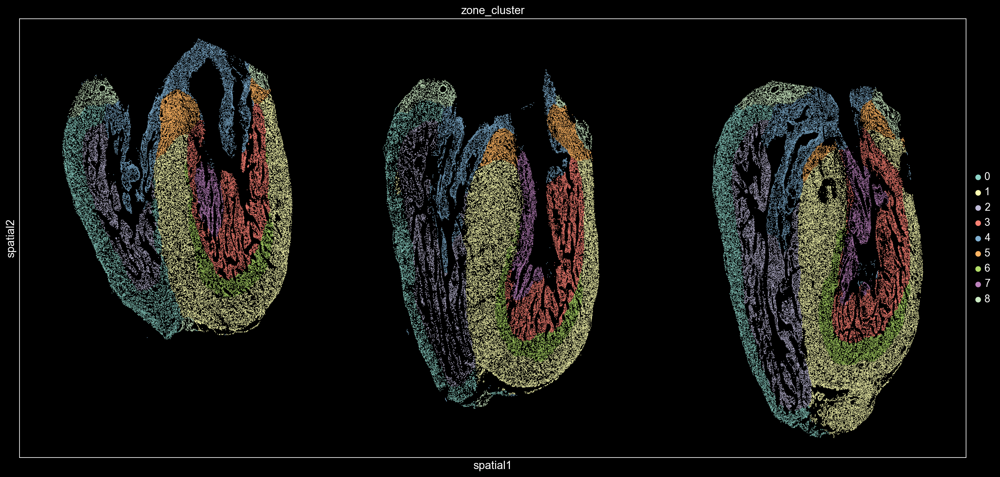

In [19]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish_subset, 
                basis="spatial", color="zone_cluster", size=3)
plt.style.use('default')

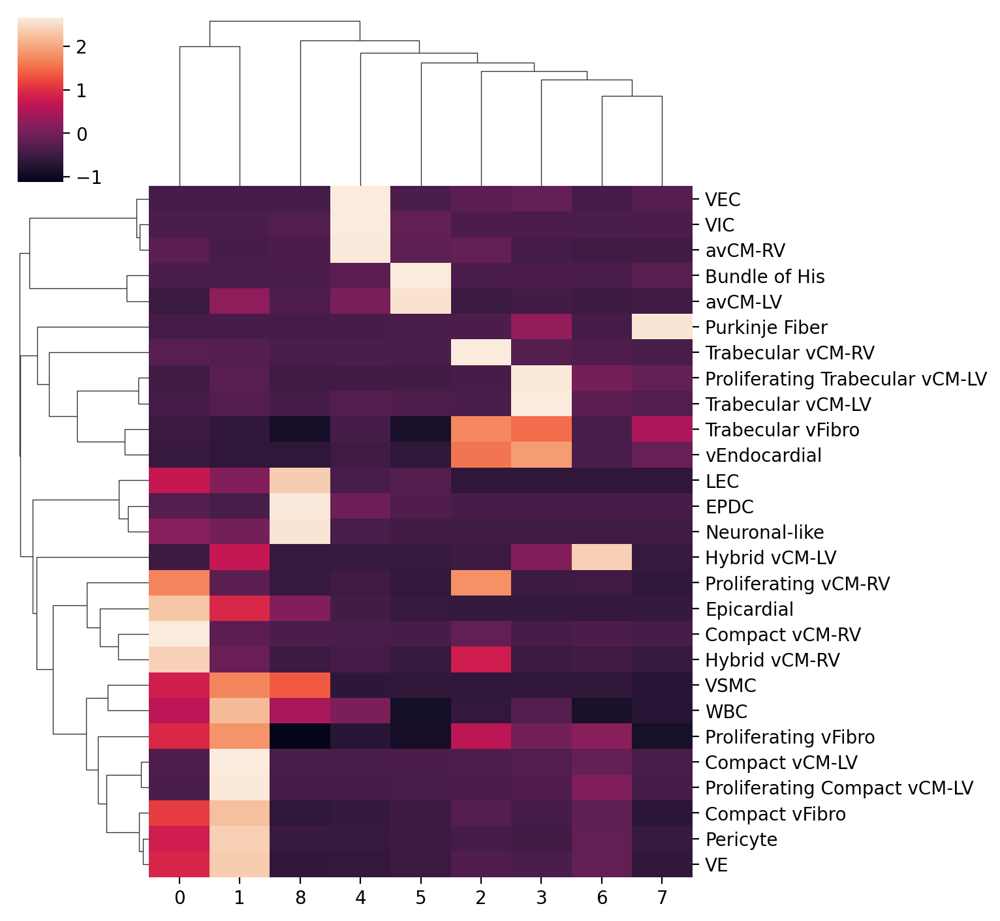

In [20]:
df = adata_merfish_subset.obs.groupby([celltype_key,'zone_cluster']).size().unstack(fill_value=0).to_numpy()
plot_df = pd.DataFrame(df, 
                       index=adata_merfish_subset.obs[celltype_key].cat.categories, 
                       columns=adata_merfish_subset.obs['zone_cluster'].cat.categories)
plot_df_norm_row = plot_df.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
g = sns.clustermap(plot_df_norm_row)
g.fig.set_size_inches(7,7)

## Annotate clusters

In [21]:
spatial_cluster_annotations = {'0':'Outer-RV', '1':'Outer-LV', '2':'Inner-RV', 
                               '3':'Inner-LV', '4':'Valve', '5':'Bundle of His', '6':'Mid-LV', 
                               '7':'Subendocardial', '8':'Subepicardial'}
adata_merfish_subset.obs['communities'] = adata_merfish_subset.obs['zone_cluster'].replace(spatial_cluster_annotations)

In [22]:
adata_merfish_subset.uns['communities_colors'] = ['#CEA2E3','#00B7CA','#A8C7E9','#8CCA7C',
                                                  '#F37121','#FBB36E','#8B58A4',
                                                  '#00A163','#B5FF7F']

... storing 'communities' as categorical


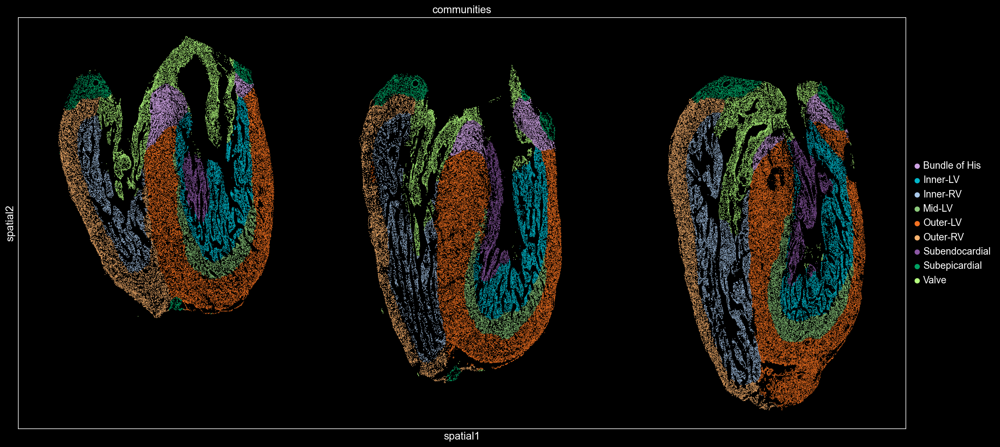

In [23]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish_subset, 
                basis="spatial", color="communities", size=3)
plt.style.use('default')

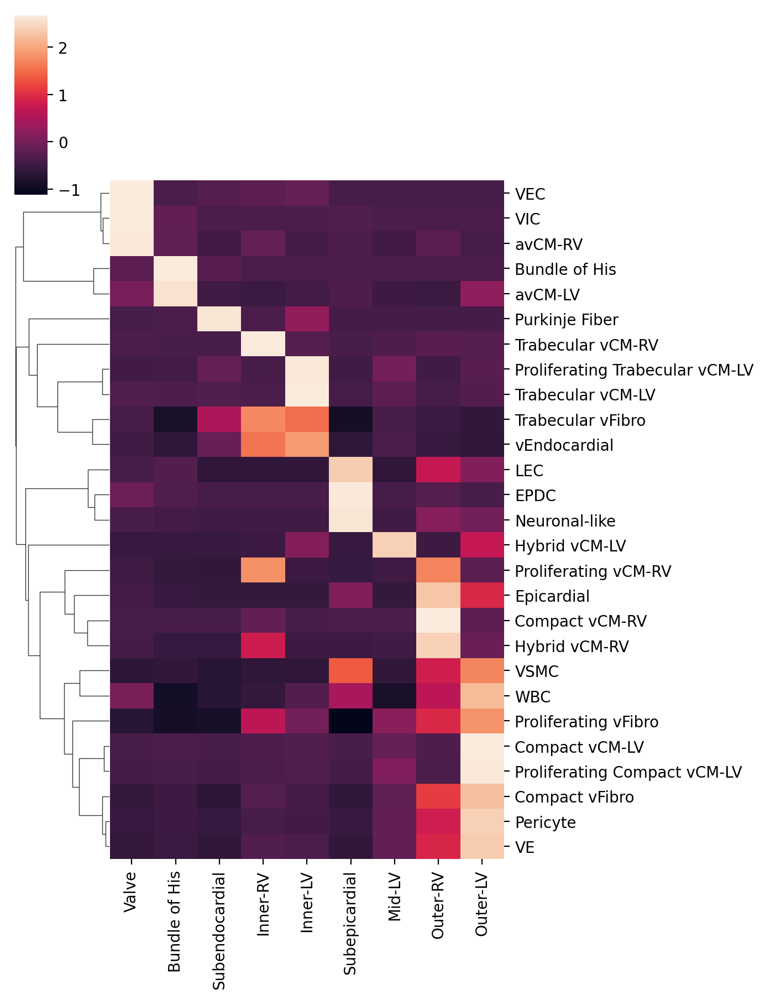

In [24]:
celltype_key = 'celltype_vent'
df = adata_merfish_subset.obs.groupby([celltype_key,'communities']).size().unstack(fill_value=0).to_numpy()
plot_df = pd.DataFrame(df, 
                       index=adata_merfish_subset.obs[celltype_key].cat.categories, 
                       columns=adata_merfish_subset.obs['communities'].cat.categories)
com_order = ['Valve','Bundle of His','Subendocardial','Inner-RV','Inner-LV','Subepicardial','Mid-LV',
             'Outer-RV','Outer-LV']
plot_df = plot_df.loc[:,com_order]
plot_df_norm_row = plot_df.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
g = sns.clustermap(plot_df_norm_row, col_cluster=False)
g.fig.set_size_inches(6,9)

In [25]:
# adata_merfish_subset.write('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15_ventricle.h5ad')